In [1]:
target_class = 'genre_romance'

In [2]:
# from tensorflow import stop_gradient
# from tensorflow import gradients
# from tensorflow import gradients
# import tensorflow

In [3]:
import csv
import numpy as np
import pandas as pd
import scipy
import os
import re
import sklearn

import matplotlib.pyplot as plt
from matplotlib import cm, transforms

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# from tensorflow import set_random_seed
# from tensorflow.keras import backend
from keras import backend
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Embedding, Conv1D, Conv2D, MaxPooling1D, MaxPooling2D, MaxPool2D, Dense, Input, GlobalMaxPooling1D, Dropout, Concatenate, Flatten
from keras.models import Model
from keras.layers.core import Reshape
# from tensorflow.keras.layers import Reshape
from keras import regularizers
from sklearn.model_selection import train_test_split
from keras.callbacks import ModelCheckpoint
from keras.initializers import Constant
from keras.optimizers import Adam

Using TensorFlow backend.


In [4]:
# import csv
# import numpy as np
# import pandas as pd
# import scipy
# import os
# import re
# import sklearn

# import matplotlib.pyplot as plt
# from matplotlib import cm, transforms

# from sklearn.metrics import confusion_matrix
# from sklearn.metrics import classification_report

# # from tensorflow import set_random_seed
# # from tensorflow.keras import backend
# from tensorflow.keras.preprocessing.text import Tokenizer
# from tensorflow.keras.preprocessing.sequence import pad_sequences
# from tensorflow.keras.layers import Embedding, Conv1D, Conv2D, MaxPooling1D, MaxPooling2D, MaxPool2D, Dense, Input, GlobalMaxPooling1D, Dropout, Concatenate, Flatten
# from tensorflow.keras.models import Model
# # from keras.layers.core import Reshape
# from tensorflow.keras.layers import Reshape
# from tensorflow.keras import regularizers
# from sklearn.model_selection import train_test_split
# from tensorflow.keras.callbacks import ModelCheckpoint
# from tensorflow.keras.initializers import Constant
# from tensorflow.keras.optimizers import Adam

In [5]:
import innvestigate
import innvestigate.applications
import innvestigate.applications.mnist
import innvestigate.utils as iutils
import innvestigate.utils.visualizations as ivis
from innvestigate.utils.tests.networks import base as network_base

In [6]:
path = 'C:\\Users\\Sh\\Desktop\\IMDB_Plots'
# path = '/home/mh/IMDB/'
os.chdir(path)

## Loading the data

In [7]:
data = pd.read_csv('_data_v2_clean.csv')

In [8]:
labels = data[['genre_drama', 'genre_comedy', 'genre_action', 'genre_romance', 'genre_crime', 'genre_sci_fi']]
data = data['text']


In [9]:
data0 = data[labels[target_class] ==0]
data1 = data[labels[target_class] ==1]

label0 = labels[labels[target_class] == 0]
label1 = labels[labels[target_class] == 1]

m = np.min([label0.shape[0], label1.shape[0]], axis = 0)

# making balanced set
data0, _, label0, _ = train_test_split(data0, label0, test_size= 1 - (label1.shape[0] / label0.shape[0]) , random_state=42)

data = np.concatenate([data0, data1], axis = 0)
labels = pd.concat([label0, label1], axis = 0)


In [10]:
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.15, random_state=42)
print(np.sum(y_train, axis = 0))
print(np.sum(y_test, axis = 0))

genre_drama       749
genre_comedy      775
genre_action      231
genre_romance    1401
genre_crime       102
genre_sci_fi       88
dtype: int64
genre_drama      134
genre_comedy     147
genre_action      46
genre_romance    213
genre_crime       22
genre_sci_fi      16
dtype: int64


# Tokenizing the data, and making the dictionart

In [11]:
NUM_WORDS = 50000 # Max number of words to embed
tokenizer = Tokenizer(num_words=NUM_WORDS, filters='!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n', lower=True)
tokenizer.fit_on_texts(data)
unique_words = tokenizer.word_index

In [12]:
w = csv.writer(open('___dict.csv', 'w'))
for key, val in unique_words.items():
    try:
        w.writerow([key, val])
    except:
        w.writerow(['unkwown_word'+str(val), val])

In [13]:
train_data = tokenizer.texts_to_sequences(X_train)
test_data  = tokenizer.texts_to_sequences(X_test)

In [14]:
pad_size = 250
train_data = pad_sequences(train_data, maxlen = pad_size)
test_data  = pad_sequences(test_data , maxlen = pad_size)

## Loading ConceptNet NumberBatch pre-trained vectors

In [15]:
Embedding_Dim = 300
exceptions = 0
embeddings_index = {}

with open('numberbatch-en-17.06_correct.txt', encoding="UTF-8") as f:
    for line in f:
        try:
            values = line.split(',')
            word = values[0]
            coefs = np.asarray(values[1:], dtype='float32')
            embeddings_index[word] = coefs
        except:
            exceptions = exceptions + 1
    

In [16]:
exceptions

25

## Making the embedding matix, covering only the data dictionary

In [17]:
num_words = min(NUM_WORDS, len(unique_words)) + 1
embedding_matrix = np.zeros((num_words, Embedding_Dim))
for word, i in unique_words.items():
    if i > NUM_WORDS:
        continue
    embedding_vector = embeddings_index.get(word)
    
    if embedding_vector is not None:
        # words not found in embedding index will be all-zeros.
        embedding_matrix[i] = embedding_vector
    

In [18]:
print(num_words)

47938


In [19]:
np.save('embedding_matrix.npy', embedding_matrix)
del embeddings_index

In [20]:
# get the number of words that are available in pre-trained embedding:
x = embedding_matrix[:,0]
print(len(x))
print(len(x[x!= 0]))

47938
37706


# Converting the train and test data to emdedding data

In [21]:
train_emb = np.zeros([train_data.shape[0], pad_size, Embedding_Dim])
test_emb  = np.zeros([test_data.shape[0] , pad_size, Embedding_Dim])

for i in np.arange(train_emb.shape[0]):
    train_emb[i,:,:] = [embedding_matrix[int(j),:] for j in train_data[i,:]]
for i in np.arange(test_emb.shape[0]):
    test_emb[i,:,:]  = [embedding_matrix[int(j),:] for j in test_data[i] ]

In [22]:
print(train_emb.shape)
print(test_emb.shape)

(2743, 250, 300)
(485, 250, 300)


# Building the model

In [23]:
sequence_length = train_data.shape[1]
filter_sizes = [2,3,4]
num_filters = 150
drop = 0.4

epochs = 12
batch_size = 30

# inputs = Input(shape=(sequence_length,), dtype='int32')
# layer_embedding = Embedding(input_dim=len(unique_words) + 1,
#                            output_dim = Embedding_Dim,
#                            embedding_initializer = Constant(embedding_matreix),
#                            imput_length=sequence_length trainable=False)
# embedding = layer_embedding(inputs)
# layer_reshape = Reshape((sequence_length, Embedding_Dim, 1))
# reshape = layer_reshape(embedding)

embedding = Input(shape=((sequence_length, Embedding_Dim,)))
layer_reshape = Reshape((sequence_length, Embedding_Dim, 1))
reshaped = layer_reshape(embedding)


layer_conv_0 = Conv2D(num_filters, kernel_size=(filter_sizes[0], Embedding_Dim),
                     padding='valid', kernel_initializer='normal', activation='relu')
layer_conv_1 = Conv2D(num_filters, kernel_size=(filter_sizes[1], Embedding_Dim),
                     padding='valid', kernel_initializer='normal', activation='relu')
layer_conv_2 = Conv2D(num_filters, kernel_size=(filter_sizes[2], Embedding_Dim),
                     padding='valid', kernel_initializer='normal', activation='relu')

conv_0 = layer_conv_0(reshaped)
conv_1 = layer_conv_1(reshaped)
conv_2 = layer_conv_2(reshaped)

layer_maxpool_0 = MaxPool2D(pool_size=(sequence_length - filter_sizes[0] + 1, 1), strides=(1,1), padding='valid')
layer_maxpool_1 = MaxPool2D(pool_size=(sequence_length - filter_sizes[1] + 1, 1), strides=(1,1), padding='valid')
layer_maxpool_2 = MaxPool2D(pool_size=(sequence_length - filter_sizes[2] + 1, 1), strides=(1,1), padding='valid')

maxpool_0 = layer_maxpool_0(conv_0)
maxpool_1 = layer_maxpool_1(conv_1)
maxpool_2 = layer_maxpool_2(conv_2)

layer_concatenated_tensor = Concatenate(axis=1)
concatenated_tensor = layer_concatenated_tensor([maxpool_0, maxpool_1, maxpool_2])

layer_flatten = Flatten()
flatten = layer_flatten(concatenated_tensor)
layer_dropout = Dropout(drop)
dropout = layer_dropout(flatten)

# layer_output = Dense(units =2, activation='softmax')
layer_output = Dense(units =1, activation='sigmoid')
output = layer_output(dropout)

# model = Model(inputs=inputs, outputs=output)
model = Model(inputs=embedding, outputs=output)

checkpoint = ModelCheckpoint('weights.{epoch:03d}-{val_acc:.4f}.hdf5',
                            monitor = 'val_acc',
                            verbose=1,
                            save_best_only=True,
                            mode='auto')
adam = Adam(lr=1e-4, beta_1=0.9, beta_2=0.999, epsilon=1e-8, decay=0.0)
model.compile(optimizer = adam, loss='binary_crossentropy', metrics=['accuracy'])

# Train the model on train_data

In [24]:
model.fit(train_emb, np.asarray(y_train[target_class]),
         batch_size=batch_size,
         epochs=epochs, verbose=1,
         callbacks=[checkpoint],
         validation_data = (test_emb, np.asarray(y_test[target_class])))

Train on 2743 samples, validate on 485 samples
Epoch 1/12
2743/2743 [==============================] - 51s 19ms/step - loss: 0.6863 - acc: 0.5527 - val_loss: 0.6603 - val_acc: 0.7320

Epoch 00001: val_acc improved from -inf to 0.73196, saving model to weights.001-0.7320.hdf5
Epoch 2/12
2743/2743 [==============================] - 50s 18ms/step - loss: 0.6462 - acc: 0.6486 - val_loss: 0.6269 - val_acc: 0.7711

Epoch 00002: val_acc improved from 0.73196 to 0.77113, saving model to weights.002-0.7711.hdf5
Epoch 3/12
2743/2743 [==============================] - 50s 18ms/step - loss: 0.6091 - acc: 0.7102 - val_loss: 0.5997 - val_acc: 0.7794

Epoch 00003: val_acc improved from 0.77113 to 0.77938, saving model to weights.003-0.7794.hdf5
Epoch 4/12
2743/2743 [==============================] - 50s 18ms/step - loss: 0.5733 - acc: 0.7514 - val_loss: 0.5856 - val_acc: 0.7856

Epoch 00004: val_acc improved from 0.77938 to 0.78557, saving model to weights.004-0.7856.hdf5
Epoch 5/12
2743/2743 [======

## Evaluation on test data

In [25]:
pred = np.round(model.predict(test_emb))[:,0]
conf_matrix = confusion_matrix(y_test[target_class], pred)
evaluation = classification_report(y_test[target_class], pred)
print(conf_matrix)
print(evaluation)

[[223  49]
 [ 37 176]]
             precision    recall  f1-score   support

          0       0.86      0.82      0.84       272
          1       0.78      0.83      0.80       213

avg / total       0.82      0.82      0.82       485



In [26]:
# model.fit(test_emb, np.asarray(y_test[target_class]),
#          batch_size=batch_size,
#          epochs=epochs, verbose=1,
#          callbacks=[checkpoint],
#          validation_data = (train_emb, np.asarray(y_train[target_class])))

In [27]:
# eval_text = np.concatenate([X_tr, X_ts], axis=0)
# eval_data = np.concatenate([train_data, test_data], axis=0)
# eval_emb = np.concatenate([train_emb, test_emb], axis = 0)
# eval_y = pd.concat([y_train, y_test], axis = 0)

In [28]:
# pred = np.round(model.predict(eval_emb))[:,0]
# conf_matrix = confusion_matrix(eval_y[target_class], pred)
# evaluation = classification_report(eval_y[target_class], pred)
# print(conf_matrix)
# print(evaluation)

# Fining True Positive Cases

In [29]:
pred = np.round(model.predict(train_emb))[:,0]
X_tr = np.asarray(tokenizer.sequences_to_texts(train_data))
tp_text = X_tr[y_train[target_class] + pred == 2]
tp_data = train_data[y_train[target_class] + pred == 2 , :]
tp_emb  = train_emb[y_train[target_class] + pred == 2]
tp_y    = y_train[y_train[target_class] + pred == 2]

In [30]:
# Visualization Function

def plot_text_heatmap(words, scores, title='', width=10, height=0.2, verbose=0, max_word_per_line=20):
    fig = plt.figure(figsize=(width,height))
    ax  = plt.gca()
    ax.set_title(title, loc='left')
    tokens = words
    if verbose >0:
        print('error')
    
    cmap = plt.cm.ScalarMappable(cmap=cm.bwr)
    cmap.set_clim(0,1)
    
    canvas = ax.figure.canvas
    t = ax.transData
    
    normalized_scores = 0.5 * scores / np.max(np.abs(scores)) + 0.5
    
    loc_y = -0.2
    
    for i, token in enumerate(tokens):
        *rgb, _ = cmap.to_rgba(normalized_scores[i], bytes = True)
        color = '#%02x%02x%02x' % tuple(rgb)
        
        text = ax.text(0.0, loc_y, token,
                      bbox={
                          'facecolor': color,
                          'pad': 5.0,
                          'linewidth': 1,
                          'boxstyle': 'round,pad=0.5'
                      }, transform=t)
        text.draw(canvas.get_renderer())
        ex = text.get_window_extent()
        
        if (i+1) % max_word_per_line == 0:
            loc_y = loc_y - 2.5
            t = ax.transData
        else:
            t = transforms.offset_copy(text._transform, x=ex.width+15, units='dots')
    if verbose == 0:
        ax.axis('off')

In [31]:
analyzer = innvestigate.create_analyzer("lrp.z", model)
result = analyzer.analyze(tp_emb)
result = np.sum(result, axis = 2)

In [32]:
top_token_score = np.zeros(num_words)
top_token_freq = np.zeros(num_words)

In [33]:
for i in np.arange(tp_data.shape[0]):
    instance = tp_data[i:(i+1),:]
    scores = result[i,:]
    
    for j in np.arange(pad_size):
        w = int(instance[0][j])
        
        if w < num_words and w > 0 and scores[j] <20 and scores[j] > -20:
            top_token_score[w] += scores[j]
            top_token_freq[w] += 1
    

In [34]:
word_text = [words for words, i in unique_words.items()][0:50000]
word_text = list(' ') + word_text
l = len(word_text)
top_token = pd.DataFrame({
    'word_num': np.arange(l),
    'word_text': word_text,
    'sum_score': top_token_score,
    'freq': top_token_freq,
    'score_avg': top_token_score / (0.00001 + top_token_freq)},
    columns=['word_num','word_text','sum_score','freq','score_avg'])

In [35]:
top_token.to_csv('list_of_top_important_tokens_' + target_class + '.csv')

In [36]:
x = top_token.sort_values(by='score_avg', ascending=False)
x[x['freq'] > 25].head(30)

,word_num,word_text,sum_score,freq,score_avg
3,3,love,1042.591577,2172.0,0.480015
1330,1330,loss,9.577554,27.0,0.354724
875,875,romance,24.276342,75.0,0.323685
850,850,loved,32.475802,102.0,0.318390
1402,1402,spending,10.563202,37.0,0.285492
1819,1819,fiancée,7.232999,26.0,0.278192
165,165,loves,99.828163,369.0,0.270537
679,679,romantic,19.231911,76.0,0.253051
1933,1933,relationships,9.541452,38.0,0.251091
2620,2620,awkward,7.514373,31.0,0.242399


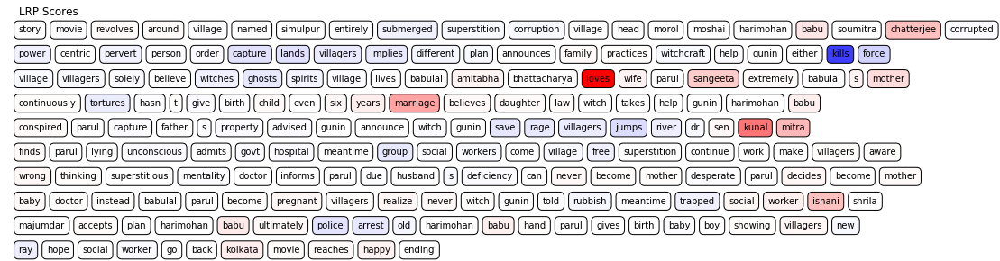

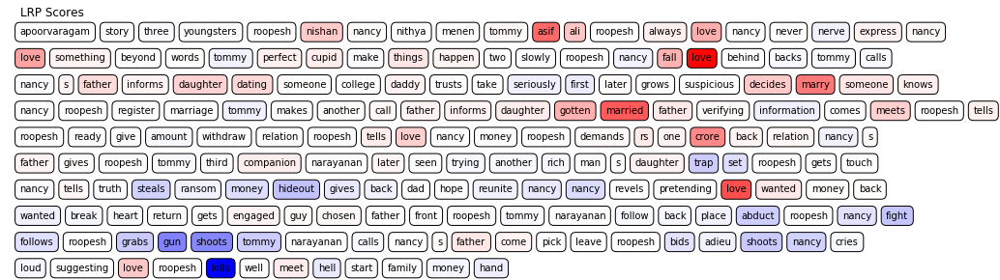

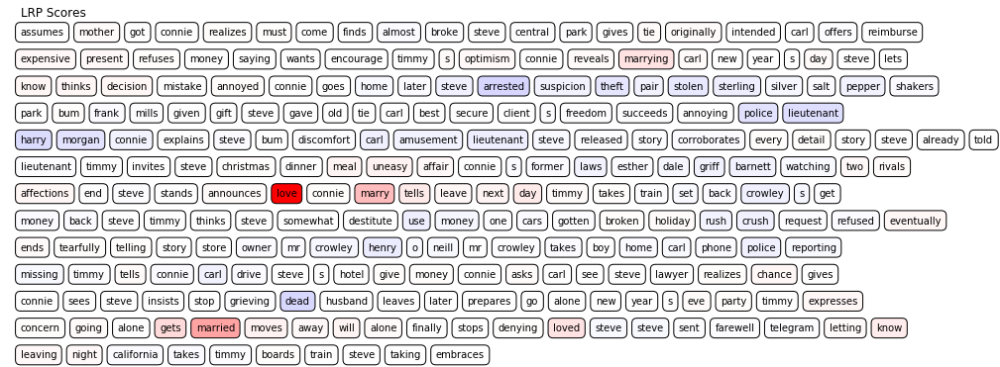

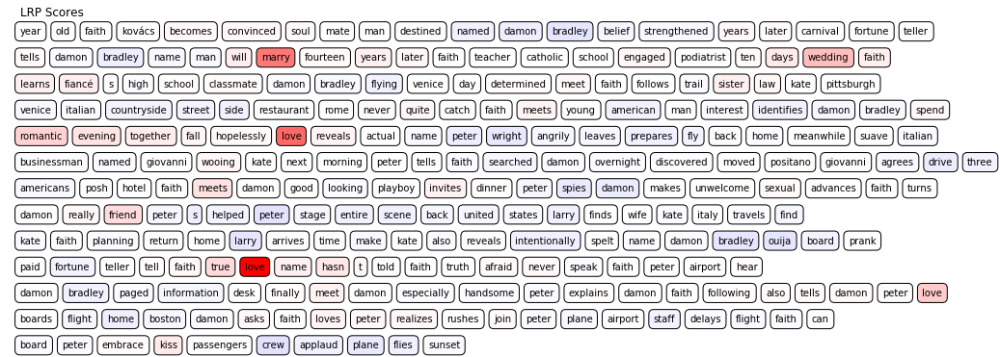

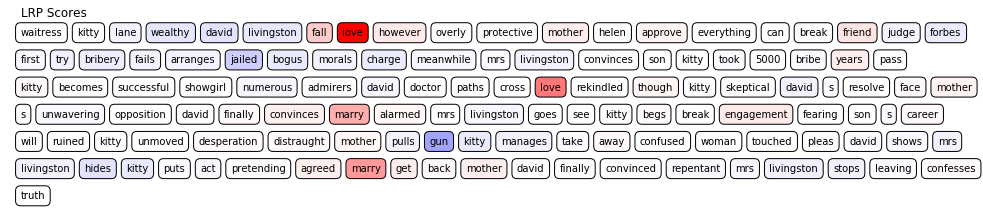

...

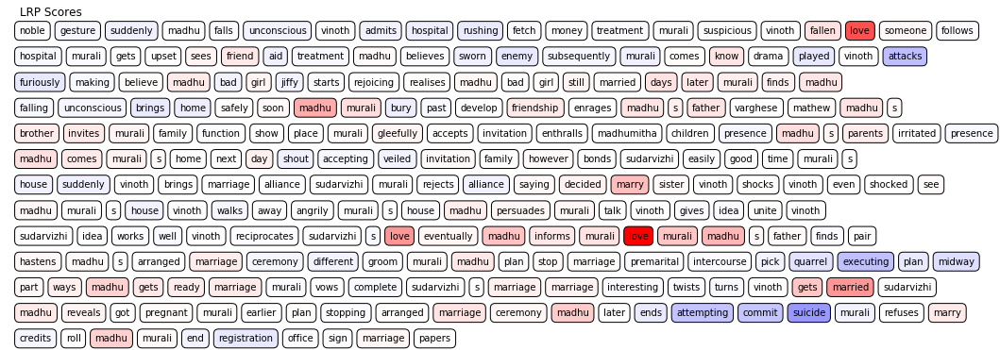

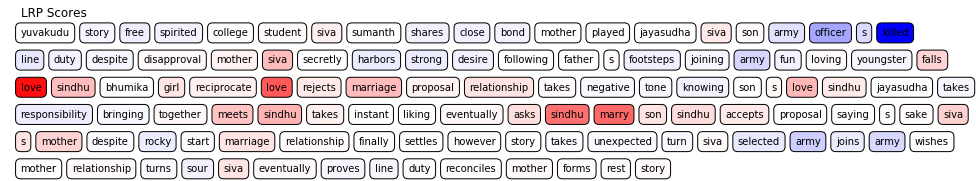

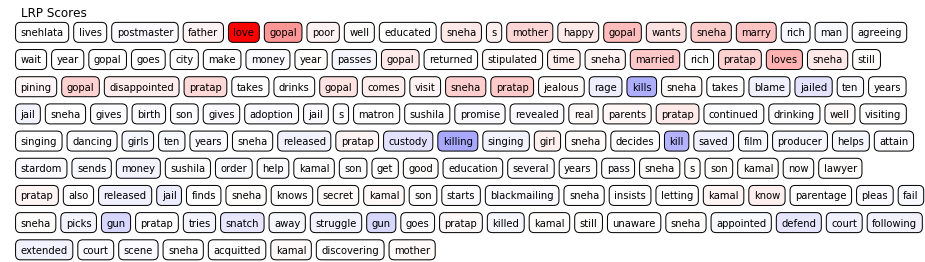

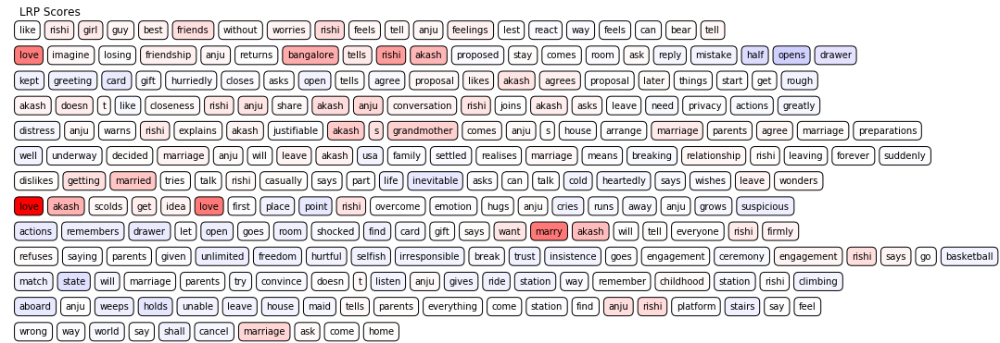

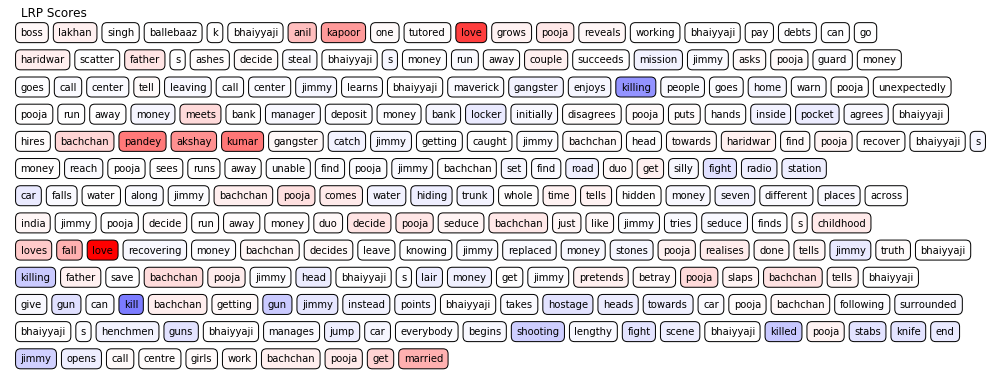

In [37]:
for i in np.arange(50):
    leni = pad_size - len(tp_text[i].split(' '))
    leni = np.max([leni, 0])
    plot_text_heatmap(tp_text[i].split(' ')[:pad_size],
                     np.array(result[i,leni:(pad_size+1)]),
                     "LRP Scores")
    plt.show()